# 01 Exploring KITTI

The format of each Velodyne file is 32-bit floats representing an array of [x, y, z, b] points, where "b" is brightness or irradiance. There is otherwise no delimiter. 

In [ ]:
#|default_exp kitti.vis

In [ ]:
#| hide
from nbdev.showdoc import *

In [ ]:
#| export
from typing import Union, Iterable, List
from pathlib import Path
from os import PathLike, environ

from pathlib import Path
from PIL import Image
import numpy as np
import open3d as o3d

import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import plotly.graph_objects as go


In [ ]:
#| export
KITTI_ROOT:Path = environ.get("KITTI_ROOT", Path("/media/usbhd4tb/datasets/kitti"))

# Documentation: https://www.open3d.org/docs/release/python_api/open3d.ml.torch.datasets.KITTI.html
ds:o3d.ml.datasets.KITTI = o3d.ml.datasets.KITTI(KITTI_ROOT)

In [ ]:
len(ds.get_split("train"))

3712

In [ ]:
from collections import defaultdict
counts = defaultdict(int)

for label in (KITTI_ROOT/"training"/"label_2").glob("*"):
    num     = label.stem
    calib   = ds.read_calib(KITTI_ROOT/"training"/"calib"/(num+".txt"))
    label:List[o3d._ml3d.datasets.kitti.Object3d] = ds.read_label(label, calib)
    for box in label:
        counts[box.label_class] += 1

In [ ]:
counts

defaultdict(int,
            {'Car': 28742,
             'DontCare': 13873,
             'Van': 2914,
             'Pedestrian': 4487,
             'Cyclist': 1627,
             'Person_sitting': 222})

In [ ]:
#| export
def loadVeloAsPcd(fname: Union[str, PathLike])->o3d.geometry.PointCloud:
    points                  = o3d.ml.datasets.KITTI.read_lidar(fname)
    cloud                   = o3d.t.geometry.PointCloud()
    cloud.point.positions   = o3d.core.Tensor(points[:, :3])
    cloud.point.intensities = o3d.core.Tensor(points[:, 3])
    cloud.remove_duplicated_points()
    cloud.remove_statistical_outliers(3, .999)
    cloud.estimate_normals()
    cloud.point.colors      = 0.5 + cloud.point.normals * 0.5
    cloud.estimate_color_gradients()
 #  cloud.estimate_normals(search_param = o3d.geometry.KDTreeSearchParamHybrid(radius = 0.1, max
    return cloud

In [ ]:
num:str = "000000"
fname   = KITTI_ROOT/"training"/"velodyne_reduced"/(num+".bin")
cloud   = loadVeloAsPcd(fname)
cloud

PointCloud on CPU:0 [20285 points (Float32)].
Attributes: color_gradients (dtype = Float32, shape = {20285, 3}), colors (dtype = Float32, shape = {20285, 3}), normals (dtype = Float32, shape = {20285, 3}), intensities (dtype = Float32, shape = {20285}).

In [ ]:
#| export
def plotCloud(
        cloud: o3d.t.geometry.PointCloud, 
        boxes:Iterable[o3d._ml3d.datasets.kitti.Object3d] = [])->go.Figure:
    
    points = cloud.point.positions.numpy()
    colors = cloud.point.colors.numpy()

    # Add the point cloud
    data = [go.Scatter3d(
        x=points[:, 0], y=points[:, 1], z=points[:, 2],
        mode = 'markers',
        marker = {"size": 1, "color": colors}
    )]

    # Add bounding boxes
    for box in boxes:
        corners = box.generate_corners3d()
        x, y, z = corners[:, 0], corners[:, 1], corners[:, 2]
        mesh = go.Mesh3d(
            x=x, y=y, z=z,
            color='rgba(0, 255, 0, 0.5)',  # Semi-transparent green
            opacity=0.5
        )
        data.append(mesh)

    # Global figure settings
    layout = {
        "scene": {
            "xaxis": {"visible": False},
            "yaxis": {"visible": False},
            "zaxis": {"visible": False}
        }
    }

    fig = go.Figure(data=data, layout=layout)
    return fig

In [ ]:
fig = plotCloud(cloud)
fig.show()

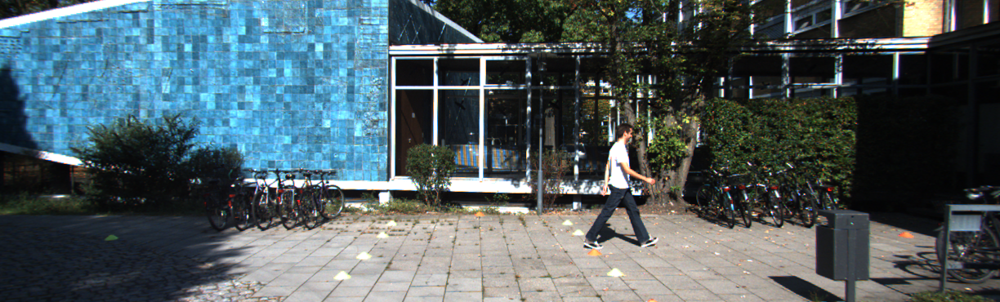

In [ ]:
image = KITTI_ROOT/"training"/"image_2"/(num+".png")
with Image.open(image) as png:
    png.show()

In [ ]:
calib = ds.read_calib(KITTI_ROOT/"training"/"calib"/(num+".txt"))
calib

{'world_cam': array([[-0.0015961 , -0.00527065,  0.9999848 ,  0.        ],
        [-0.99991626,  0.0128487 , -0.00152827,  0.        ],
        [-0.01284044, -0.99990356, -0.00529071,  0.        ],
        [-0.02236671, -0.05967891, -0.332549  ,  1.        ]],
       dtype=float32),
 'cam_img': array([[ 7.070493e+02,  0.000000e+00,  0.000000e+00,  0.000000e+00],
        [ 0.000000e+00,  7.070493e+02,  0.000000e+00,  0.000000e+00],
        [ 6.040814e+02,  1.805066e+02,  1.000000e+00,  1.000000e+00],
        [ 4.575831e+01, -3.454157e-01,  4.981016e-03,  0.000000e+00]],
       dtype=float32)}

In [ ]:
# TODO: Project this correctly in to the 3D plot
label = KITTI_ROOT/"training"/"label_2"/(num+".txt")
label:List[o3d._ml3d.datasets.kitti.Object3d] = ds.read_label(label, calib)
label[0].generate_corners3d()


array([[-4.9337853 ,  1.84000001, 79.32568998],
       [-3.20378585,  1.84000001, 79.32431234],
       [-3.20621464,  1.84000001, 76.27431331],
       [-4.93621409,  1.84000001, 76.27569095],
       [-4.9337853 ,  0.18000001, 79.32568998],
       [-3.20378585,  0.18000001, 79.32431234],
       [-3.20621464,  0.18000001, 76.27431331],
       [-4.93621409,  0.18000001, 76.27569095]])

In [ ]:
counts

defaultdict(int,
            {'Car': 28742,
             'DontCare': 13873,
             'Van': 2914,
             'Pedestrian': 4487,
             'Cyclist': 1627,
             'Person_sitting': 222})

In [ ]:
#| hide
import nbdev; nbdev.nbdev_export()